# Showcase the pretrained model on test input
The dataloading and generational parts are based on the [pix2pix paper](https://arxiv.org/abs/1611.07004).

## Import libraries




In [6]:
import tensorflow as tf
import os
import pathlib
import time
import datetime
import random
from natsort import natsorted
from glob import glob

from matplotlib import pyplot as plt
from IPython import display

In [ ]:
# showset

import zipfile

#path to zip of showset
zip_file = "./Data/Showset.zip"
extract_dir = './Data/'

with zipfile.ZipFile(zip_file, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

#Path to unzipped dataset
PATH = "./Data/Showset"

# paths to folder where checkpoints (weights) are saved
PATH_cp = "./checkpoints/checkpoint_pretrained/"

## Define necessary dataset creation functions

In [9]:
def load(input, output):
  # Read and decode an image file to a uint8 tensor
  input_image = tf.io.read_file(input)
  input_image = tf.io.decode_jpeg(input_image)

  output_image = output

  real_image = tf.io.read_file(output_image)
  real_image = tf.io.decode_jpeg(real_image)

  # Convert both images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

In [10]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
# Each image is 512x512 in size
IMG_WIDTH = 512
IMG_HEIGHT = 512

In [11]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [12]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [13]:
def load_image_test(input, output):
  input_image, real_image = load(input,output)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

## Build an input pipeline for P2P and real life show pictures 

In [14]:
try: 

  #P2P showset
  p2p = natsorted(glob(PATH + '/P2P/img_base/*.jpg'))
  mask_paths = [ip.replace("base","mod") for ip in p2p]

  input_file_dataset = tf.data.Dataset.from_tensor_slices(p2p)
  output_file_dataset = tf.data.Dataset.from_tensor_slices(mask_paths)

  # Create a dataset containing pairs of input and output file paths
  p2p_showset = tf.data.Dataset.zip((input_file_dataset, output_file_dataset))

  #real life showset
  realset = natsorted(glob(PATH + '/real_life/*.jpg'))
  mask_paths = realset

  input_file_dataset = tf.data.Dataset.from_tensor_slices(realset)
  output_file_dataset = tf.data.Dataset.from_tensor_slices(mask_paths)

  # Create a dataset containing pairs of input and output file paths
  real_life_showset = tf.data.Dataset.zip((input_file_dataset, output_file_dataset))  

except tf.errors.InvalidArgumentError:
  exit()

p2p_showset = p2p_showset.map(load_image_test)
p2p_showset = p2p_showset.batch(BATCH_SIZE)

real_life_showset = real_life_showset.map(load_image_test)
real_life_showset = real_life_showset.batch(BATCH_SIZE)

## Construct the Generator

The generator is essentially a tailored version of the [U-Net](https://arxiv.org/abs/1505.04597), composed of two main components: an encoder which downsamples, and a decoder which upsamples.

* Every module within the encoder follows the sequence: Convolution, then Batch 
normalization, and finally Leaky ReLU.

* Each unit within the decoder is structured as: Transposed convolution, followed by Batch normalization, with Dropout applied to the initial three blocks, and concluding with ReLU.

* As in the original U-Net architecture, there are skip connections bridging the encoder and the decoder.

Define the downsampler (encoder):

In [15]:
OUTPUT_CHANNELS = 3

In [16]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

Define the upsampler (decoder):

In [17]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

Define the generator with the downsampler and the upsampler:

In [18]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[512, 512, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False), 
    downsample(128, 4),  
    downsample(256, 4),  
    downsample(512, 4),  
    downsample(512, 4),  
    downsample(512, 4),  
    downsample(512, 4),  
    downsample(512, 4),  
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),
    upsample(512, 4, apply_dropout=True),  
    upsample(512, 4, apply_dropout=True),  
    upsample(512, 4, apply_dropout=True), 
    upsample(512, 4),  
    upsample(256, 4),  
    upsample(128, 4), 
    upsample(64, 4),  # (batch_size, 64, 64, 64)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 512, 512, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [19]:
generator = Generator()

## Generate images

Write functions to plot the images.


In [20]:
def generate_images_p2p(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Prompt2Prompt', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [21]:
def generate_images_real_life(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(10, 10))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

## checkout the saved checkpoints (saved weights)

In [22]:
!ls {PATH_cp}

checkpoint		     ckpt-1.data-00000-of-00001
ckpt-10.data-00000-of-00001  ckpt-1.index
ckpt-10.index		     ckpt-20.data-00000-of-00001
ckpt-11.data-00000-of-00001  ckpt-20.index
ckpt-11.index		     ckpt-2.data-00000-of-00001
ckpt-12.data-00000-of-00001  ckpt-2.index
ckpt-12.index		     ckpt-3.data-00000-of-00001
ckpt-13.data-00000-of-00001  ckpt-3.index
ckpt-13.index		     ckpt-4.data-00000-of-00001
ckpt-14.data-00000-of-00001  ckpt-4.index
ckpt-14.index		     ckpt-5.data-00000-of-00001
ckpt-15.data-00000-of-00001  ckpt-5.index
ckpt-15.index		     ckpt-6.data-00000-of-00001
ckpt-16.data-00000-of-00001  ckpt-6.index
ckpt-16.index		     ckpt-7.data-00000-of-00001
ckpt-17.data-00000-of-00001  ckpt-7.index
ckpt-17.index		     ckpt-8.data-00000-of-00001
ckpt-18.data-00000-of-00001  ckpt-8.index
ckpt-18.index		     ckpt-9.data-00000-of-00001
ckpt-19.data-00000-of-00001  ckpt-9.index
ckpt-19.index


In [23]:
# Restoring the latest checkpoint in PATH_cp
checkpoint = tf.train.Checkpoint(generator=generator)
checkpoint.restore(tf.train.latest_checkpoint(PATH_cp))

## Generate some images from P2P generated input

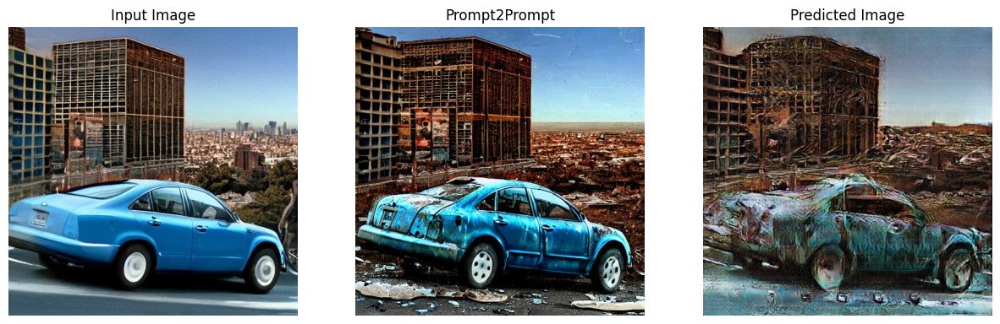

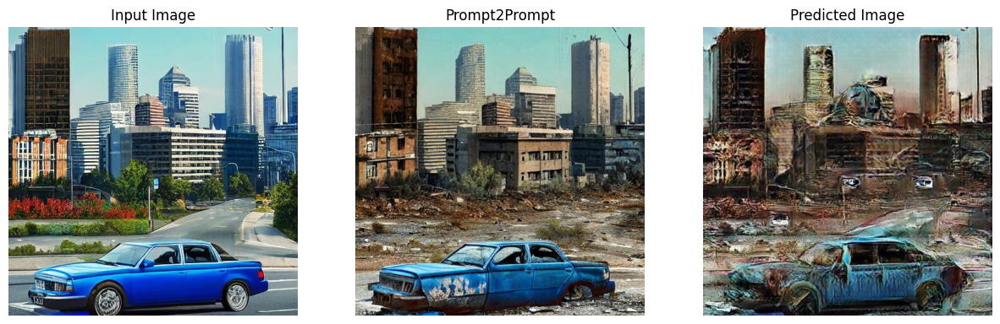

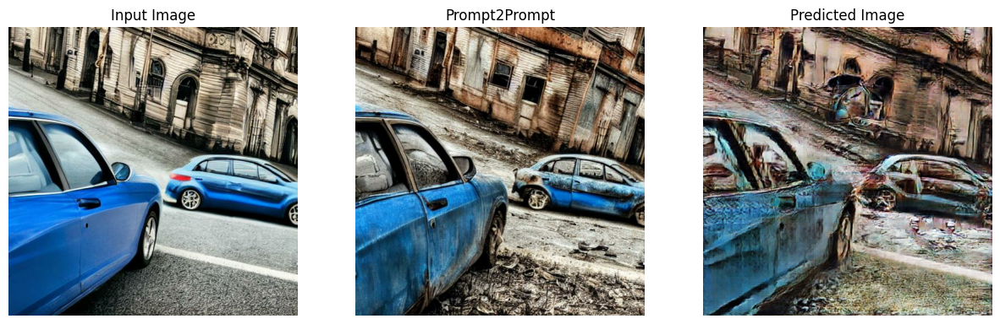

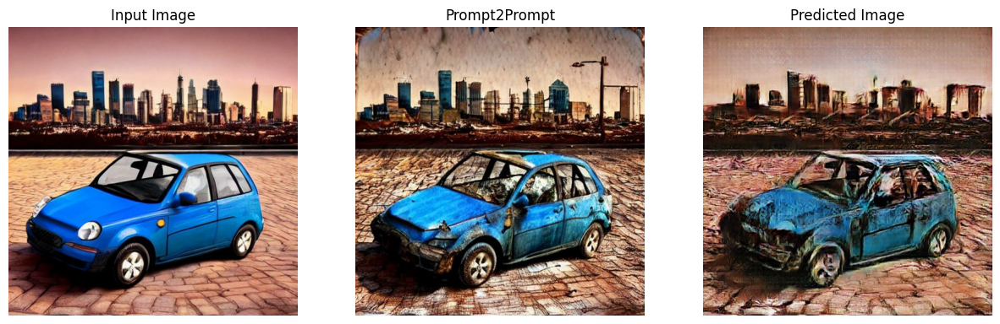

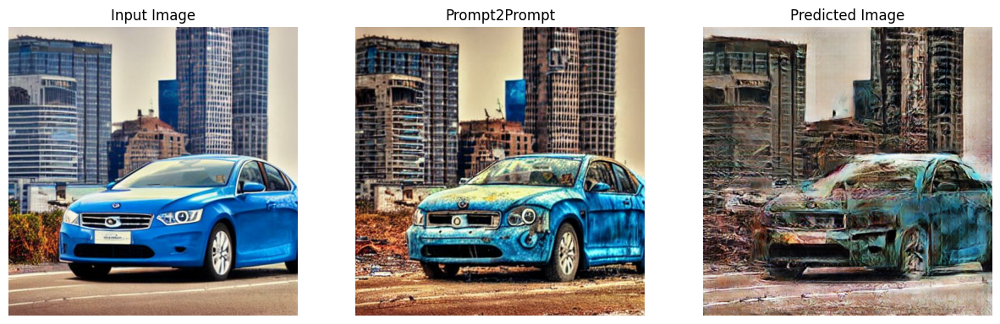

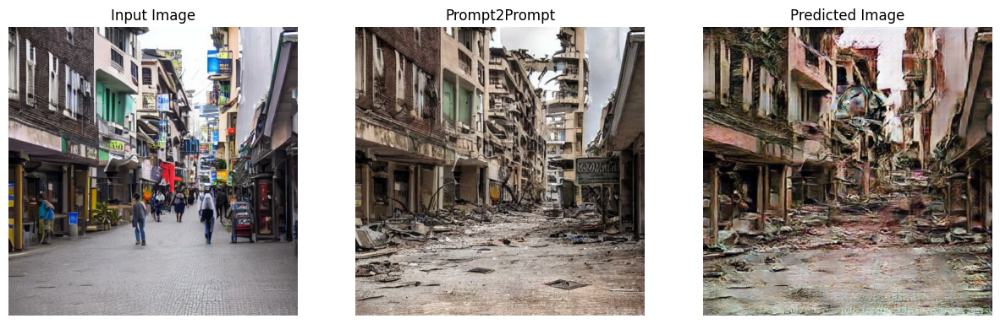

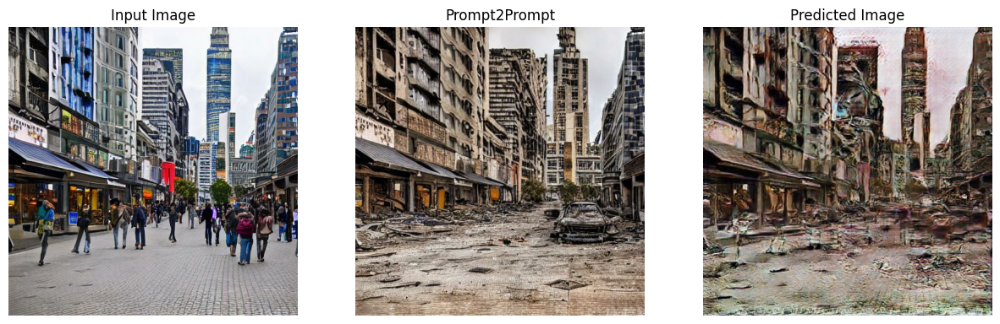

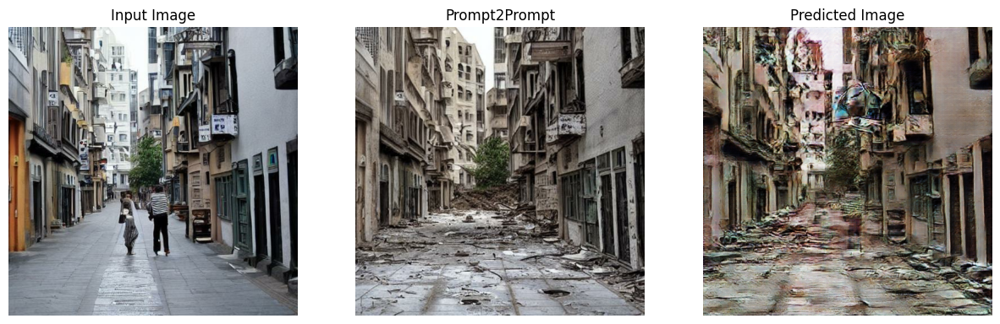

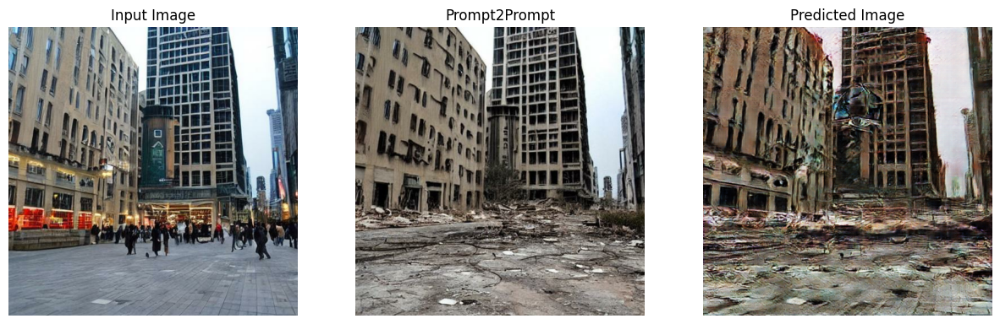

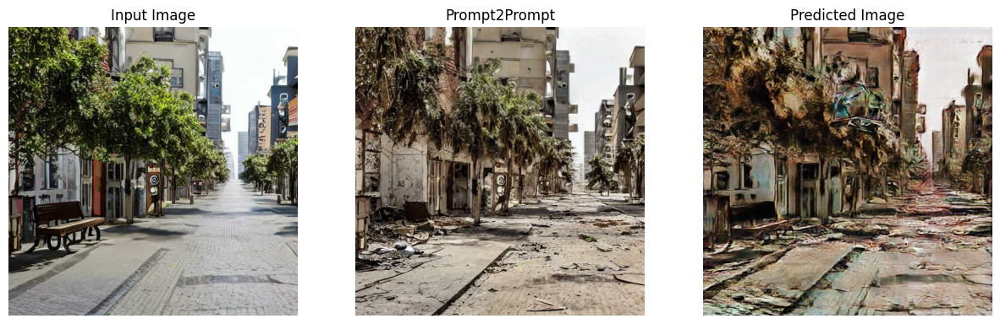

In [24]:
# Run the trained model
for inp, tar in p2p_showset.take(10):
  generate_images_p2p(generator, inp, tar)

## Generate some images from real life taken pictures


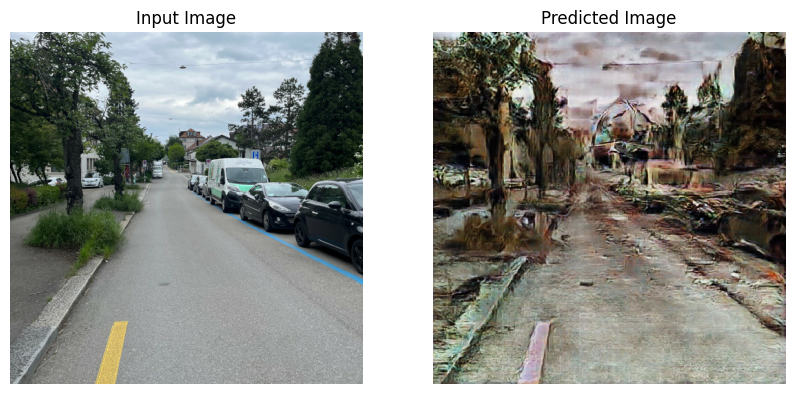

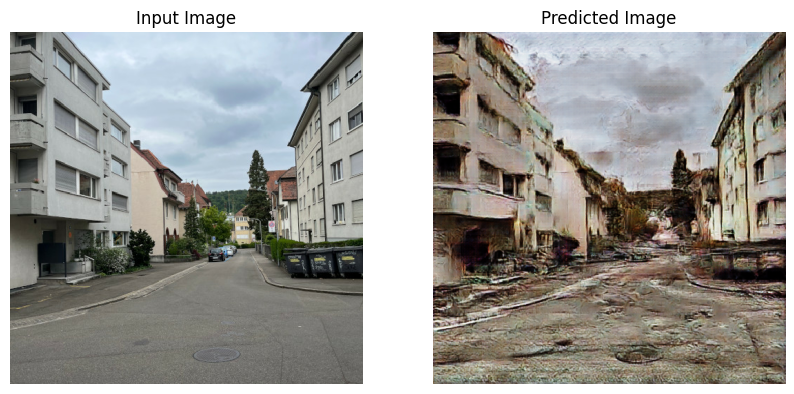

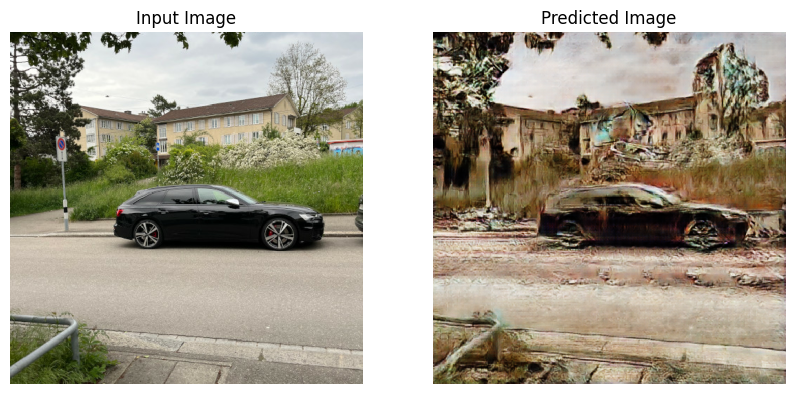

In [25]:
# Run the trained model
for inp, tar in real_life_showset.take(10):
  generate_images_real_life(generator, inp, tar)